In [1]:
# Import all the necessary modules
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as ticker
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas_datareader as pdr
import math
import datetime
import itertools
import yfinance as yf
import seaborn as sn
from IPython.display import display, HTML
from trend_following import (apply_jupyter_fullscreen_css, load_financial_data, get_returns_volatility, calculate_slope, trend_signal, slope_signal, 
                             create_trend_strategy, get_close_prices, calculate_donchian_channels)
from strategy_performance_metrics import (calculate_sharpe_ratio, calculate_calmar_ratio, calculate_CAGR, calculate_risk_and_performance_metrics,
                                          calculate_compounded_cumulative_returns, estimate_fee_per_trade, rolling_sharpe_ratio)
import coinbase_utils as cn
import strategy_performance_metrics as perf
import trend_following as tf
%matplotlib inline

In [404]:
import importlib
importlib.reload(cn)
importlib.reload(perf)
importlib.reload(tf)

<module 'trend_following' from '/Users/adheerchauhan/Documents/git/trend_following/trend_following.py'>

In [5]:
import warnings
warnings.filterwarnings('ignore')
pd.set_option('Display.max_rows', None)
pd.set_option('Display.max_columns',None)
apply_jupyter_fullscreen_css()

In [400]:
def save_historical_crypto_prices_from_coinbase_temp(ticker, end_date, save_to_file=False):

    client = cn.get_coinbase_rest_api_client(cn.key_location)
    start_date_dict = {
        'BTC-USD': '2016-01-01',
        'ETH-USD': '2016-05-01',
        'SOL-USD': '2021-06-01',
        'LTC-USD': '2021-08-01',
        'DOGE-USD': '2021-05-01',
        'CRO-USD': '2021-10-01',
        'ADA-USD': '2021-03-01',
        'AVAX-USD': '2021-09-01',
        'XRP-USD': '2023-06-01',
        'SHIB-USD': '2021-08-01',
        'LINK-USD': '2019-06-01',
        'UNI-USD': '2020-09-01',
    }
    start_date = start_date_dict.get(ticker)
    if not start_date:
        print(f"Start date for {ticker} is not included in the dictionary!")
        return None

    start_date = pd.Timestamp(start_date)
    temp_start_date = start_date
    end_date = pd.Timestamp(end_date)
    current_end_date = temp_start_date
    crypto_price_list = []
    while current_end_date < end_date:
        current_end_date = pd.to_datetime(temp_start_date) + datetime.timedelta(weeks=6)
        if current_end_date > end_date:
            current_end_date = end_date
        start_timestamp = int(temp_start_date.timestamp())
        end_timestamp = int(current_end_date.timestamp())
        # print(temp_start_date, current_end_date, end_date)
        crypto_price_list.append(
            cn.get_coinbase_daily_historical_price_data(client, ticker, start_timestamp, end_timestamp))
        temp_start_date = pd.to_datetime(current_end_date) + datetime.timedelta(days=1)

    df = pd.concat(crypto_price_list, axis=0)

    if save_to_file:
        filename = f"{ticker}-pickle-{start_date.strftime('%Y-%m-%d')}-{end_date.strftime('%Y-%m-%d')}"
        output_file = f'coinbase_historical_price_folder/{filename}'
        df.to_pickle(output_file)

    return df

In [420]:
end_date = pd.Ti

datetime.date(2024, 11, 11)

In [424]:
df = save_historical_crypto_prices_from_coinbase_temp(ticker='BTC-USD', end_date=end_date, save_to_file=False)
# df = (df[['close']].rename(columns={'close':ticker}))
# df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]

In [425]:
df.tail()

,low,high,open,close,volume
date,,,,,
2024-11-09,75758.58,76952.67,76566.72,76716.06,4836.570053
2024-11-10,76535.33,81534.28,76716.06,80428.92,16728.211051
2024-11-11,80277.34,89666.00,80427.69,88770.73,35560.118667
2024-11-12,85010.00,90100.00,88770.74,88035.43,40109.932529
2024-11-13,86220.50,88666.00,88035.43,87911.27,10519.092263


In [411]:
df.tail()

,low,high,open,close,volume
date,,,,,
2024-11-07,74463.96,76999.00,75646.55,75920.00,21932.402077
2024-11-08,75654.26,77312.18,75925.00,76566.73,18378.398763
2024-11-09,75758.58,76952.67,76566.72,76716.06,4836.570053
2024-11-10,76535.33,81534.28,76716.06,80428.92,16728.211051
2024-11-11,80277.34,89666.00,80427.69,88770.73,35560.118667


In [414]:
df_btc = df.copy()

In [37]:
df_test = cn.get_coinbase_ohlc_data(ticker=ticker)

In [43]:
df_test.index[0]

datetime.date(2016, 1, 1)

In [35]:
df.index[0]#.head()

datetime.date(2016, 1, 1)

In [89]:
## Trend Following Strategy with Moving Average Crossovers and Donchian Channels
def generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type='exponential', price_or_returns_calc='returns',
                                                rolling_donchian_window=20, include_signal_strength=True, long_only=False, use_coinbase_data=True):
    
    # Generate Trend Signal
    if use_coinbase_data:
        # df = cn.get_coinbase_ohlc_data(ticker=ticker)
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, end_date=end_date, save_to_file=False)
        df = (df[['close']].rename(columns={'close':ticker}))
        df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    else:
        df = get_close_prices(start_date, end_date, ticker, print_status=False)
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                                 f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))
    # Generate Donchian Signal
    df_donchian = generate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                             rolling_donchian_window=rolling_donchian_window, use_coinbase_data=use_coinbase_data)
    if price_or_returns_calc == 'price':

        # Buy signal: Price crosses above upper band
        df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
            (df_donchian[f'close'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price']), 1,
            np.where((df_donchian[f'close'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price']), -1, 0))
    elif price_or_returns_calc == 'returns':
        df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
            (df_donchian[f'{ticker}_pct_returns'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_returns']), 1,
            np.where((df_donchian[f'{ticker}_pct_returns'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_returns']), -1, 0))

    # Merging the Trend and donchian Dataframes
    donchian_cols = [f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}',
                     f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_signal']
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')
    
    if include_signal_strength:
        # Calculate the strength of moving average crossover and donchian signal
        df_trend[f'{ticker}_donchian_band_width_{price_or_returns_calc}'] = (df_trend[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] -
                                                                            df_trend[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'])
        donchian_strength = (np.abs(df_trend[f'{ticker}'] - df_trend[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}']) /
                            df_trend[f'{ticker}_donchian_band_width_{price_or_returns_calc}'])
        crossover_strength = np.abs(df_trend[f'{ticker}_{fast_mavg}_mavg'] - df_trend[f'{ticker}_{slow_mavg}_mavg']) / df_trend[f'{ticker}']

        df_trend[f'{ticker}_crossover_donchian_signal_strength'] = (donchian_strength + crossover_strength) / 2
        strength_threshold = 0.5
    
        # Moving Average and Donchian Channel Signal
        buy_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
                      (df_trend[f'{ticker}_trend_signal'] == 1) &
                      (df_trend[f'{ticker}_crossover_donchian_signal_strength'] > strength_threshold))
        sell_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
                       (df_trend[f'{ticker}_trend_signal'] == -1) &
                       ((df_trend[f'{ticker}_crossover_donchian_signal_strength'] > strength_threshold)))
    else:
        # Moving Average and Donchian Channel Signal
        buy_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
                      (df_trend[f'{ticker}_trend_signal'] == 1))
        sell_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
                       (df_trend[f'{ticker}_trend_signal'] == -1))
    
    if long_only:
        df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'] = (
            np.where(buy_signal, 1, 0))
    else:
        df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'] = (
            np.where(buy_signal, 1, np.where(sell_signal, -1, 0)))
        
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal')] * 
        df_trend[f'{ticker}_pct_returns'])
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal')].diff())
    
    return df_trend

def generate_donchian_channels(start_date, end_date, ticker, price_or_returns_calc='price',
                               rolling_donchian_window=20, use_coinbase_data=True):
    if use_coinbase_data:
        # df = cn.get_coinbase_ohlc_data(ticker=ticker)
        # df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, end_date=end_date, save_to_file=False)
        # df = (df[['close']].rename(columns={'close':ticker}))
        df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    else:
        df = load_financial_data(start_date, end_date, ticker, print_status=False)  # .shift(1)
        df.columns = ['open', 'high', 'low', 'close', 'adjclose', 'volume']

    if price_or_returns_calc == 'price':
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = (
            df[f'close'].rolling(window=rolling_donchian_window).max())

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = (
            df[f'close'].rolling(window=rolling_donchian_window).min())

    elif price_or_returns_calc == 'returns':
        # Calculate Percent Returns
        df[f'{ticker}_pct_returns'] = df[f'close'].pct_change()

        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).max()

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).min()

    # Middle of the channel (optional, could be just average of upper and lower)
    df[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'] = (
            (df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] +
             df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']) / 2)

    # Shift only the Keltner channel metrics to avoid look-ahead bias
    df[[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']] = df[[
        f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']].shift(1)

    return df

In [91]:
def plot_trend_following_performance(df, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, rolling_sharpe_window):
    
    start_date = pd.to_datetime(start_date).date().strftime('%Y-%m-%d')
    end_date = pd.to_datetime(end_date).date().strftime('%Y-%m-%d')
    fig = plt.figure(figsize=(22,20))
    layout = (5,2)
    trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
    trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
    trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
    trend_rolling_sharpe_ax = plt.subplot2grid(layout, (3,0), colspan=2)
    trend_return_ax = plt.subplot2grid(layout, (4,0))#, colspan=2)
    trend_cum_return_ax = plt.subplot2grid(layout, (4,1))#, colspan=2)

    if price_or_returns_calc == 'price':
        _ = trend_ax.plot(df.index, df[f'{ticker}'], label='Price')
    elif price_or_returns_calc == 'returns':
        _ = trend_ax.plot(df.index, df[f'{ticker}_pct_returns'], label='Returns')
    for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
        _ = trend_ax.plot(df.index, df[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

    _ = trend_ax.set_title(f'{ticker} Moving Average Ribbons - {start_date} - {end_date}')
    _ = trend_ax.set_ylabel('Price')
    _ = trend_ax.set_xlabel('Date')
    _ = trend_ax.legend()

    if price_or_returns_calc == 'price':
        _ = trend_donchian_ax.plot(df.index, df[f'{ticker}'], label='Price')
    elif price_or_returns_calc == 'returns':
        _ = trend_donchian_ax.plot(df.index, df[f'{ticker}_pct_returns'], label='Returns')
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'], label='Donchian Upper Band', linestyle='--', linewidth=3)
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'], label='Donchian Lower Band', linestyle='--', linewidth=3)

    _ = trend_donchian_ax.set_title(f'{ticker} Donchian Channels')
    _ = trend_donchian_ax.set_ylabel('Price')
    _ = trend_donchian_ax.set_xlabel('Date')
    _ = trend_donchian_ax.legend()

    _ = trend_signal_ax.plot(df.index,
                             df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'], label='Signal')
    _ = trend_signal_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Signal')
    _ = trend_signal_ax.set_ylabel('Signal')
    _ = trend_signal_ax.set_xlabel('Date')
    _ = trend_signal_ax.legend()

    _ = trend_rolling_sharpe_ax.plot(df.index,
                                     df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'],
                                     label='Sharpe Ratio', color='orange')
    _ = trend_rolling_sharpe_ax.set_title(f'{ticker} Rolling Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_ylabel('Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_xlabel('Date')
    _ = trend_rolling_sharpe_ax.legend()

    _ = trend_return_ax.plot(df.index,
                             df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'],
                             label='Return')
    _ = trend_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Return')
    _ = trend_return_ax.set_ylabel('Return')
    _ = trend_return_ax.set_xlabel('Date')
    _ = trend_return_ax.legend()

    # _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
    _ = trend_cum_return_ax.plot(df.index, df['strategy_cumulative_return'], label='Cum. Return')
    _ = trend_cum_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Cumulative Return')
    _ = trend_cum_return_ax.set_ylabel('Cum. Return')
    _ = trend_cum_return_ax.set_xlabel('Date')
    _ = trend_cum_return_ax.legend()


    plt.tight_layout()
    
    return

def get_trend_following_strategy_performance(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window, rolling_sharpe_window, long_only=False,
                                             include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.5, use_coinbase_data=True):
    price_or_returns_calc = 'price'
    df = generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                     mavg_stepsize=mavg_stepsize, price_or_returns_calc=price_or_returns_calc, rolling_donchian_window=rolling_donchian_window,
                                                     include_signal_strength=False, long_only=long_only, use_coinbase_data=use_coinbase_data)
    if include_transaction_costs_and_fees:
        average_fee_per_trade = estimate_fee_per_trade(passive_trade_rate=passive_trade_rate)
        adjusted_daily_returns = df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] - (
            np.abs(df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades']) * (transaction_cost_est + average_fee_per_trade))
        df['strategy_cumulative_return'] = (1 + adjusted_daily_returns).cumprod() - 1
    else:
        df['strategy_cumulative_return'] = (1 + df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns']).cumprod() - 1

    df[f'rolling_sharpe_{rolling_sharpe_window}'] = (perf.rolling_sharpe_ratio(df, window=rolling_sharpe_window, 
    strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'))
    df = df.rename(
        columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'})
    
    plot_trend_following_performance(df, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, rolling_sharpe_window)
    
    return df

In [93]:
datetime.datetime.now().date().strftime('%Y-%m-%d')

'2024-11-11'

In [95]:
## Strategy Parameters
fast_mavg = 50
slow_mavg = 250
mavg_stepsize = 6
rolling_donchian_window = 20

In [97]:
pd.to_datetime('2016-01-01').date()

datetime.date(2016, 1, 1)

BTC-USD
ETH-USD
SOL-USD
LTC-USD
DOGE-USD
CRO-USD
ADA-USD
AVAX-USD
XRP-USD
SHIB-USD
LINK-USD
UNI-USD


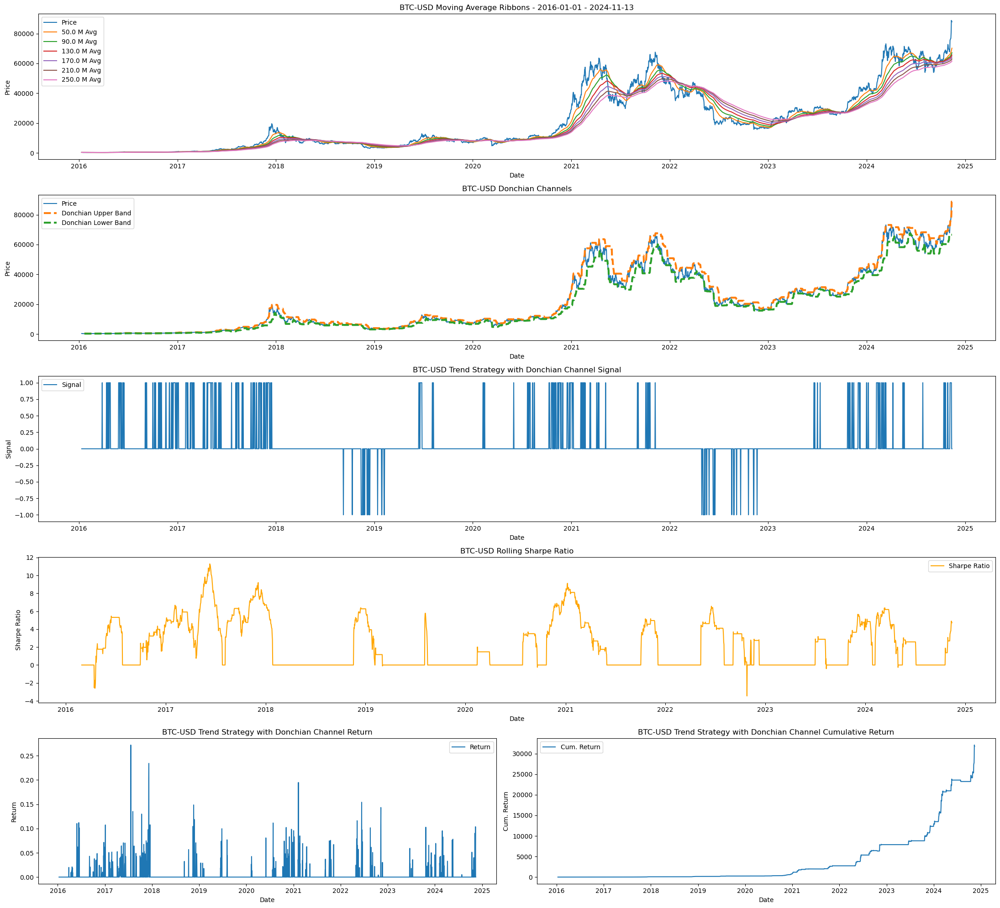

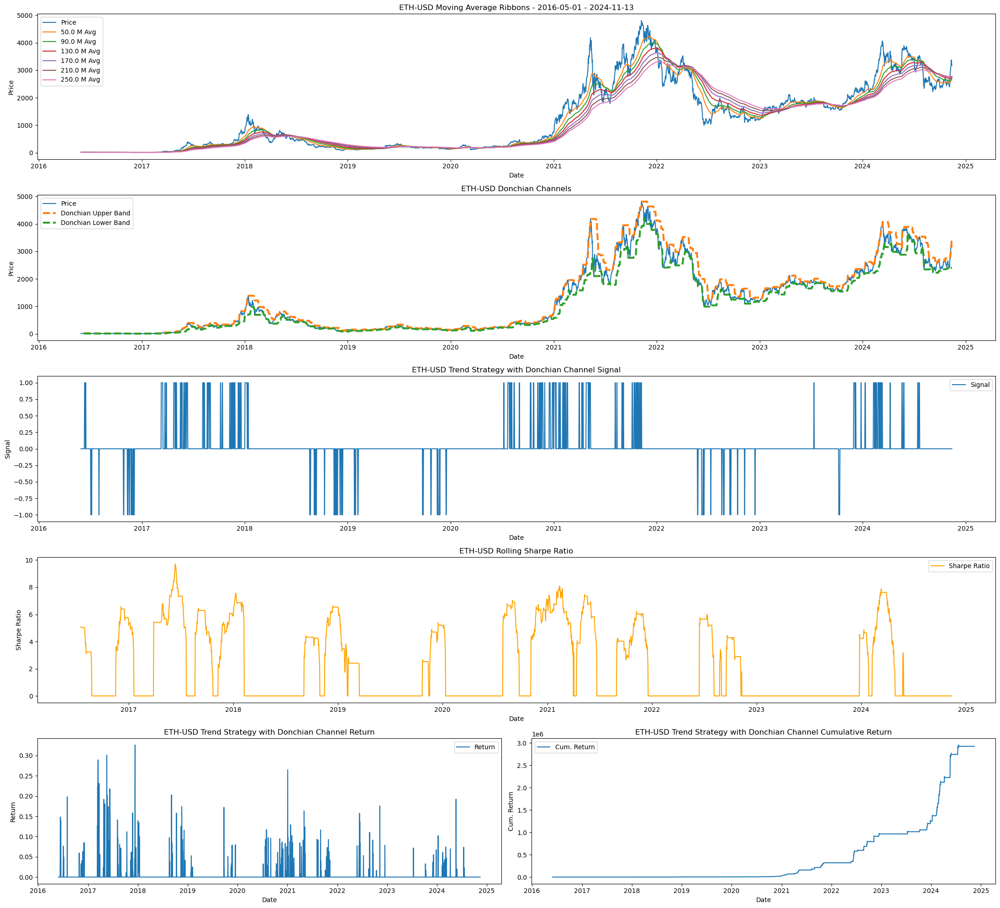

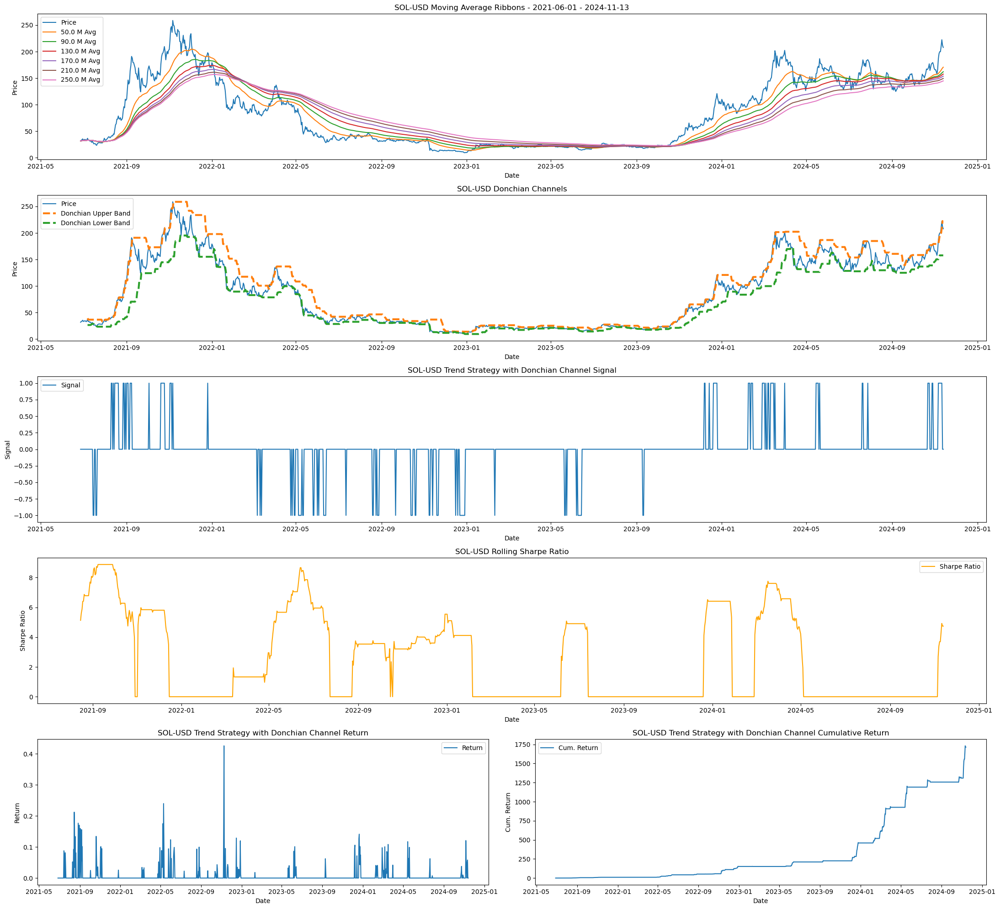

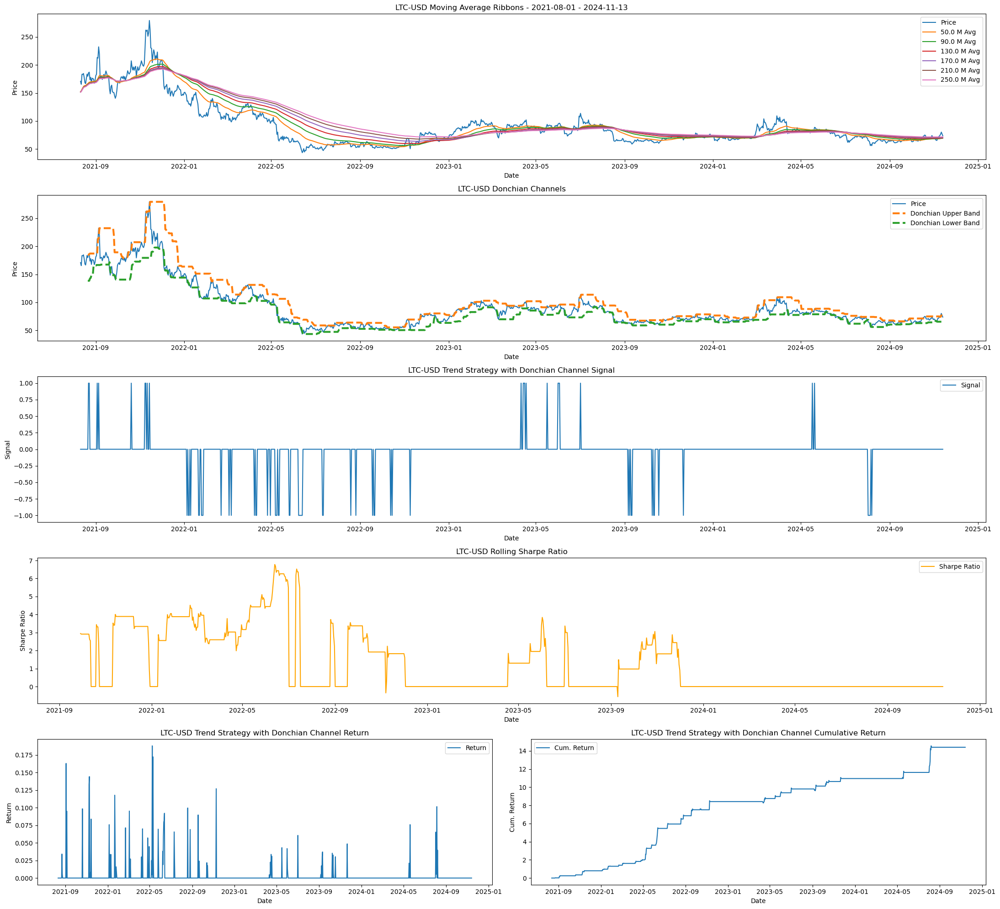

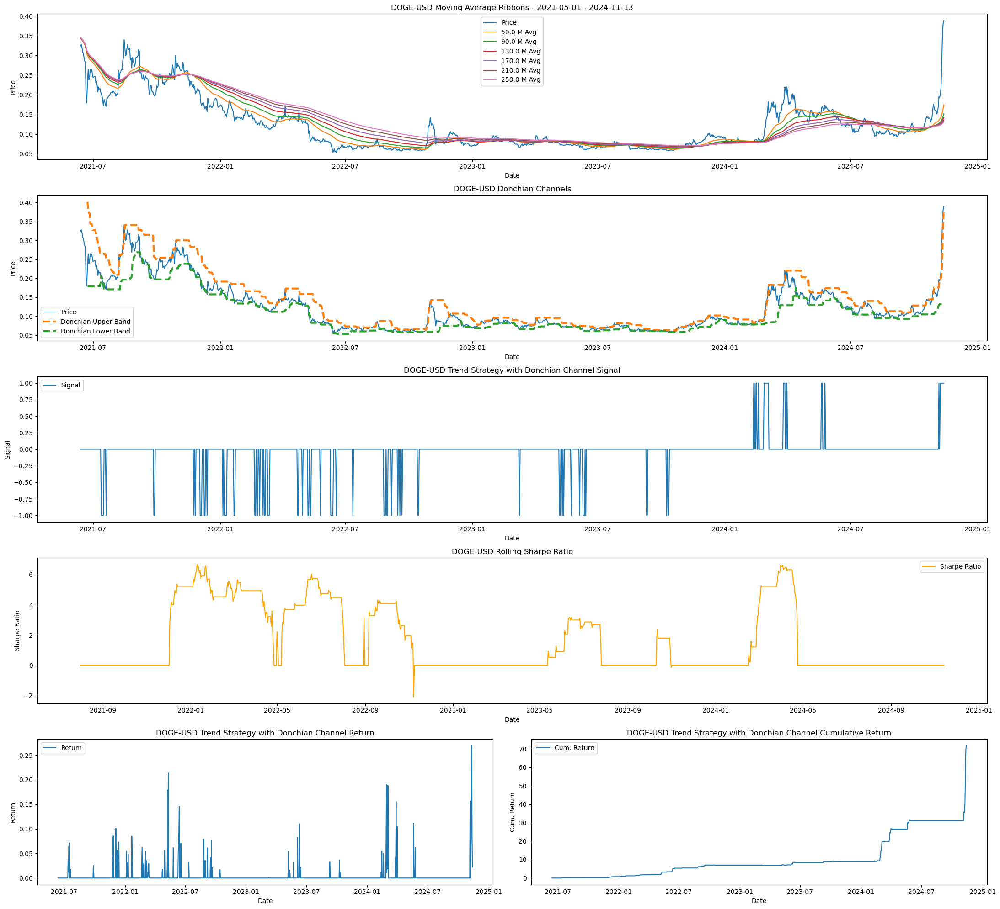

...

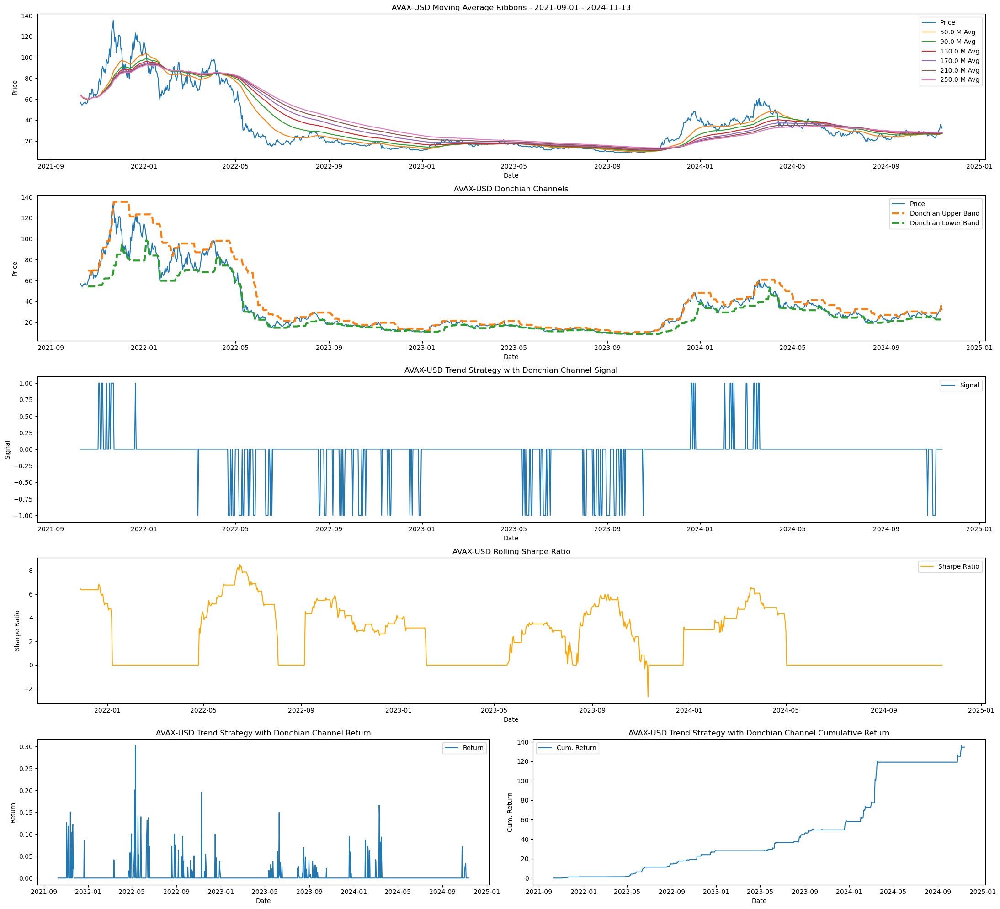

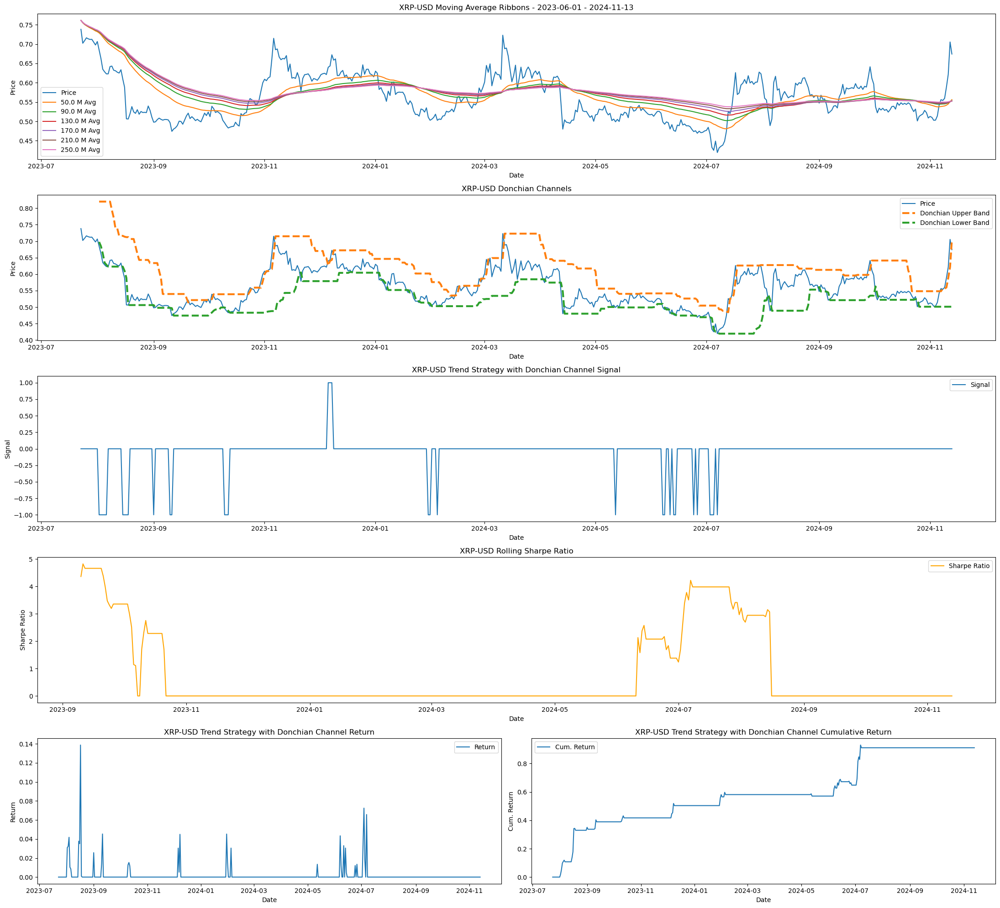

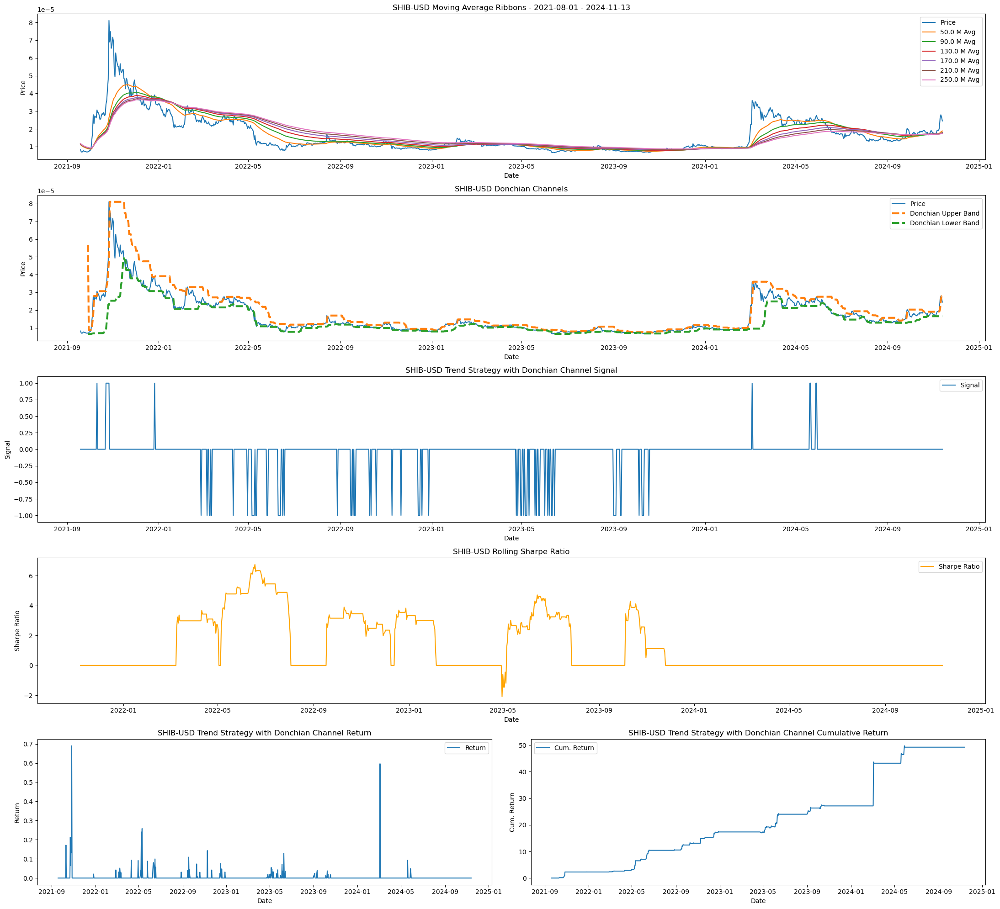

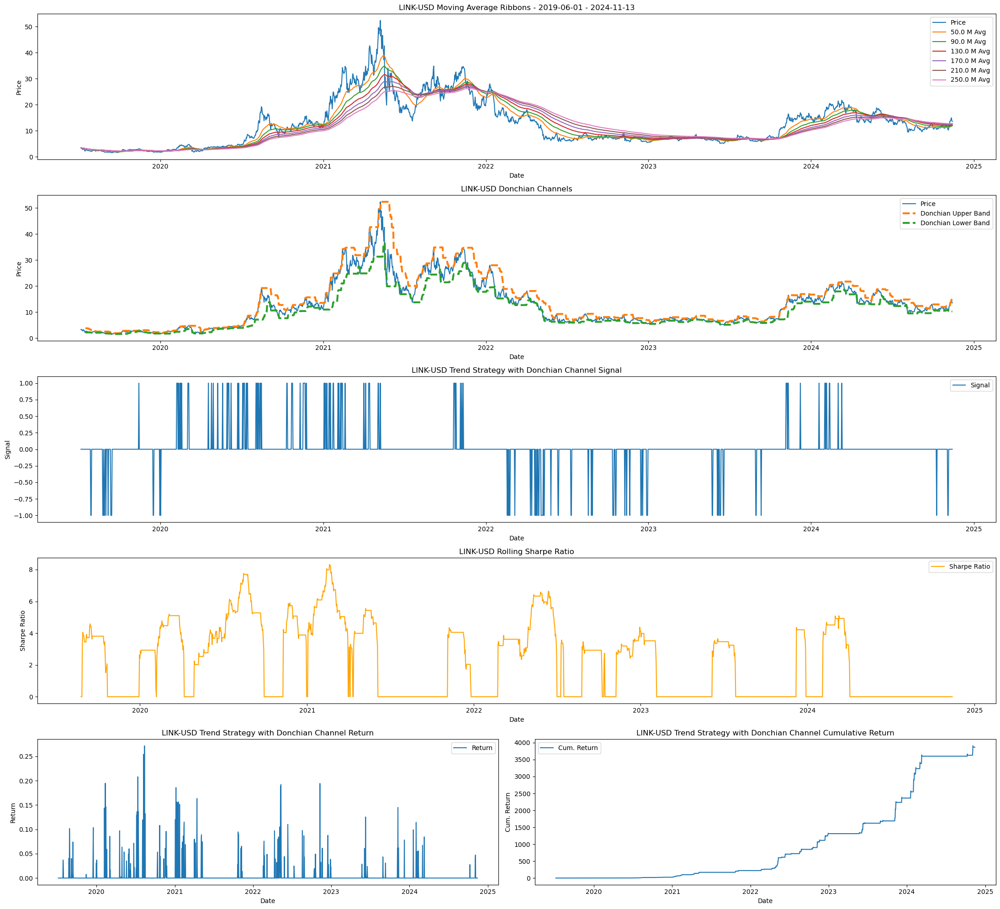

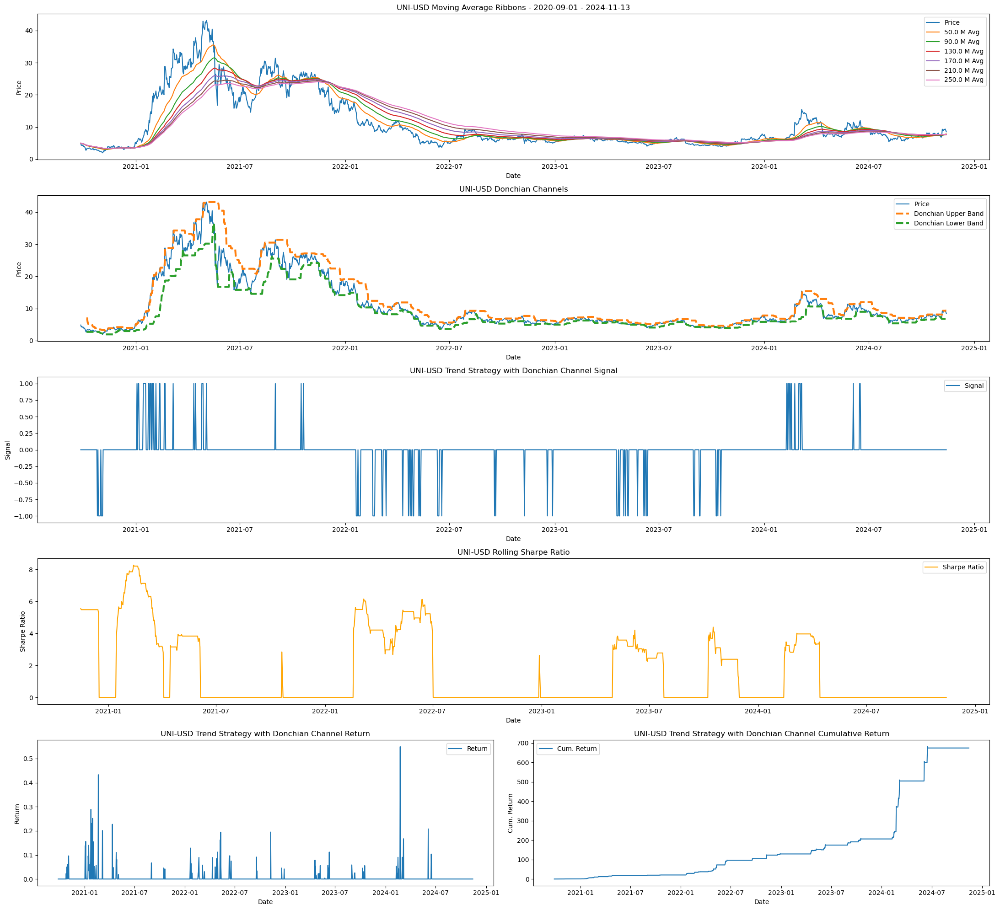

In [422]:
trend_df_dict = {}
ticker_list = ['BTC-USD','ETH-USD','SOL-USD','LTC-USD','DOGE-USD','CRO-USD','ADA-USD','AVAX-USD','XRP-USD','SHIB-USD','LINK-USD','UNI-USD']
start_date_dict = {
    'BTC-USD': '2016-01-01',
    'ETH-USD': '2016-05-01',
    'SOL-USD': '2021-06-01',
    'LTC-USD': '2021-08-01',
    'DOGE-USD': '2021-05-01',
    'CRO-USD': '2021-10-01',
    'ADA-USD': '2021-03-01',
    'AVAX-USD': '2021-09-01',
    'XRP-USD': '2023-06-01',
    'SHIB-USD': '2021-08-01',
    'LINK-USD': '2019-06-01',
    'UNI-USD': '2020-09-01',
}
end_date = datetime.datetime.now().date()#.strftime('%Y-%m-%d')
for ticker in ticker_list:
    print(ticker)
    _df_trend = get_trend_following_strategy_performance(start_date=pd.to_datetime(start_date_dict[ticker]).date(), end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize,
                                                         rolling_donchian_window=rolling_donchian_window, rolling_sharpe_window=50)
    trend_df_dict[ticker] = _df_trend

In [71]:
trend_df_dict['DOGE-USD']

,DOGE-USD,DOGE-USD_pct_returns,DOGE-USD_50_mavg,DOGE-USD_50_mavg_slope,DOGE-USD_90_mavg,DOGE-USD_90_mavg_slope,DOGE-USD_130_mavg,DOGE-USD_130_mavg_slope,DOGE-USD_170_mavg,DOGE-USD_170_mavg_slope,DOGE-USD_210_mavg,DOGE-USD_210_mavg_slope,DOGE-USD_250_mavg,DOGE-USD_250_mavg_slope,DOGE-USD_ribbon_thickness,DOGE-USD_trend_signal,DOGE-USD_trend_strategy_returns_50_6_250,DOGE-USD_trend_strategy_trades_50_6_250,DOGE-USD_trend_slope_signal,DOGE-USD_trend_slope_strategy_returns,DOGE-USD_trend_slope_strategy_trades,DOGE-USD_20_donchian_upper_band_price,DOGE-USD_20_donchian_lower_band_price,DOGE-USD_20_donchian_middle_band_price,DOGE-USD_20_donchian_signal,DOGE-USD_50_6_250_mavg_crossover_20_donchian_signal,DOGE-USD_50_6_250_mavg_crossover_20_donchian_strategy_returns,DOGE-USD_50_6_250_mavg_crossover_20_donchian_strategy_trades,strategy_cumulative_return,DOGE-USD_50_6_250_mavg_crossover_20_donchian_strategy_rolling_sharpe_50
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-06-13,0.32430,0.039090,0.342748,-5.875170e-03,0.344127,-5.737318e-03,0.344665,-5.683484e-03,0.344952,-5.654816e-03,0.345130,-5.637014e-03,0.345251,-5.624885e-03,-0.002408,-1.0,-0.039090,0.0,0.0,0.000000,0.0,NaN,NaN,NaN,0.0,0,0.000000,NaN,NaN,NaN
2021-06-14,0.32760,0.010176,0.341190,-4.776384e-03,0.342575,-4.648823e-03,0.343120,-4.598571e-03,0.343410,-4.571718e-03,0.343591,-4.555012e-03,0.343715,-4.543616e-03,-0.002503,-1.0,-0.010176,0.0,-1.0,-0.010176,-1.0,NaN,NaN,NaN,0.0,0,0.000000,0.0,0.000000,NaN
2021-06-15,0.32040,-0.021978,0.339180,-4.382613e-03,0.340633,-4.254780e-03,0.341206,-4.204178e-03,0.341513,-4.177087e-03,0.341704,-4.160216e-03,0.341834,-4.148701e-03,-0.002524,-1.0,0.021978,0.0,-1.0,0.021978,0.0,NaN,NaN,NaN,0.0,0,-0.000000,0.0,0.000000,NaN
2021-06-16,0.30770,-0.039638,0.336301,-4.370661e-03,0.337926,-4.228832e-03,0.338566,-4.172776e-03,0.338909,-4.142786e-03,0.339122,-4.124117e-03,0.339267,-4.111377e-03,-0.002654,-1.0,0.039638,0.0,-1.0,0.039638,0.0,NaN,NaN,NaN,0.0,0,-0.000000,0.0,0.000000,NaN
2021-06-17,0.30640,-0.004225,0.333702,-3.581241e-03,0.335482,-3.455193e-03,0.336183,-3.404938e-03,0.336558,-3.377965e-03,0.336792,-3.361144e-03,0.336951,-3.349654e-03,-0.002966,-1.0,0.004225,0.0,-1.0,0.004225,0.0,NaN,NaN,NaN,0.0,0,-0.000000,0.0,0.000000,NaN
2021-06-18,0.29340,-0.042428,0.330359,-3.123244e-03,0.332391,-2.996062e-03,0.333190,-2.945357e-03,0.333616,-2.918148e-03,0.333882,-2.901184e-03,0.334063,-2.889597e-03,-0.003249,-1.0,0.042428,0.0,-1.0,0.042428,0.0,NaN,NaN,NaN,0.0,0,-0.000000,0.0,0.000000,NaN
2021-06-19,0.28560,-0.026585,0.326802,-3.190100e-03,0.329122,-3.036853e-03,0.330033,-2.976300e-03,0.330518,-2.943927e-03,0.330820,-2.923785e-03,0.331026,-2.910046e-03,-0.003704,-1.0,0.026585,0.0,-1.0,0.026585,0.0,NaN,NaN,NaN,0.0,0,-0.000000,0.0,0.000000,NaN
2021-06-20,0.28030,-0.018557,0.323249,-3.078551e-03,0.325868,-2.911754e-03,0.326894,-2.845970e-03,0.327441,-2.810836e-03,0.327781,-2.788989e-03,0.328012,-2.774093e-03,-0.004224,-1.0,0.018557,0.0,-1.0,0.018557,0.0,NaN,NaN,NaN,0.0,0,-0.000000,0.0,0.000000,NaN
2021-06-21,0.17880,-0.362112,0.312609,-3.686881e-03,0.316483,-3.412711e-03,0.317974,-3.307586e-03,0.318762,-3.252095e-03,0.319249,-3.217814e-03,0.319581,-3.194537e-03,-0.004763,-1.0,0.362112,0.0,-1.0,0.362112,0.0,NaN,NaN,NaN,0.0,0,-0.000000,0.0,0.000000,NaN


In [73]:
df_donchian = tf.calculate_donchian_channels(start_date=pd.to_datetime(start_date_dict['BTC-USD']).date(), end_date=end_date, ticker='BTC-USD')

In [81]:
df_donchian.tail(200)

,low,high,open,close,volume,BTC-USD_20_donchian_upper_band_price,BTC-USD_20_donchian_lower_band_price,BTC-USD_20_donchian_middle_band_price
date,,,,,,,,
2024-04-15,62315.08,66928.82,65764.56,63452.18,21672.737013,71622.53,64024.77,67823.650
2024-04-16,61645.09,64400.00,63452.18,63814.94,17710.282132,71622.53,63452.18,67537.355
2024-04-17,59648.33,64524.14,63814.94,61279.36,21812.152979,71622.53,63452.18,67537.355
2024-04-18,60816.07,64210.00,61275.73,63513.85,15249.842114,71622.53,61279.36,66450.945
2024-04-19,59573.32,65498.99,63514.84,63848.37,22838.079342,71622.53,61279.36,66450.945
2024-04-20,63121.15,65463.08,63841.96,64968.87,5157.407265,71622.53,61279.36,66450.945
2024-04-21,64250.00,65725.81,64960.82,64952.92,4487.487232,71622.53,61279.36,66450.945
2024-04-22,64520.00,67272.73,64952.92,66859.17,10977.051786,71622.53,61279.36,66450.945
2024-04-23,65823.66,67225.66,66856.07,66414.16,8840.167498,71622.53,61279.36,66450.945
